# ekstrasi ciri citra texture buah apel dan pear

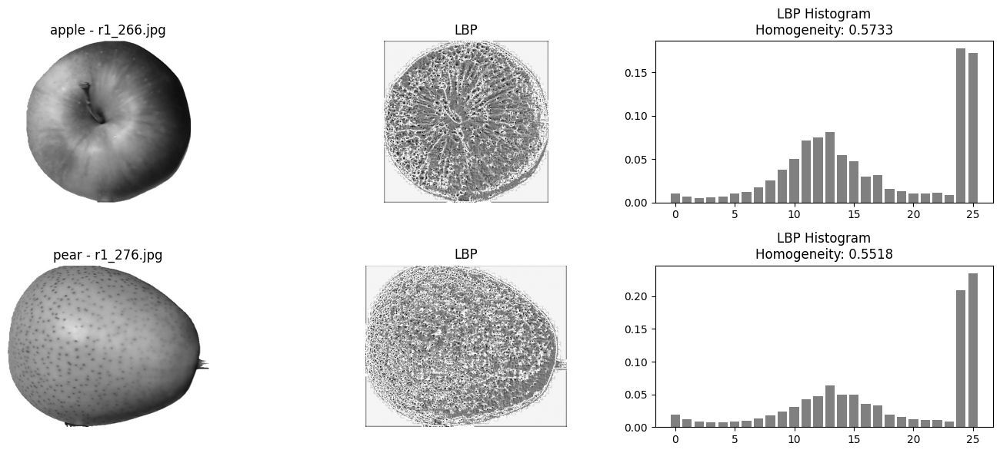

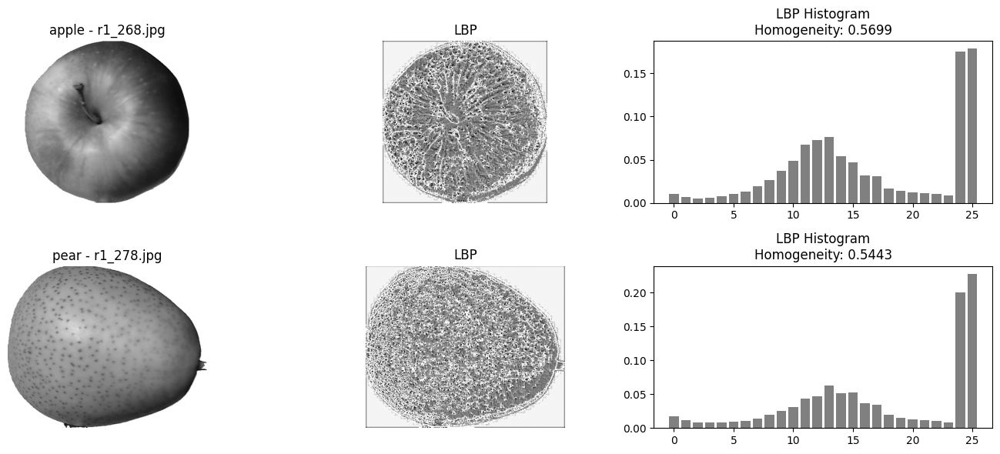

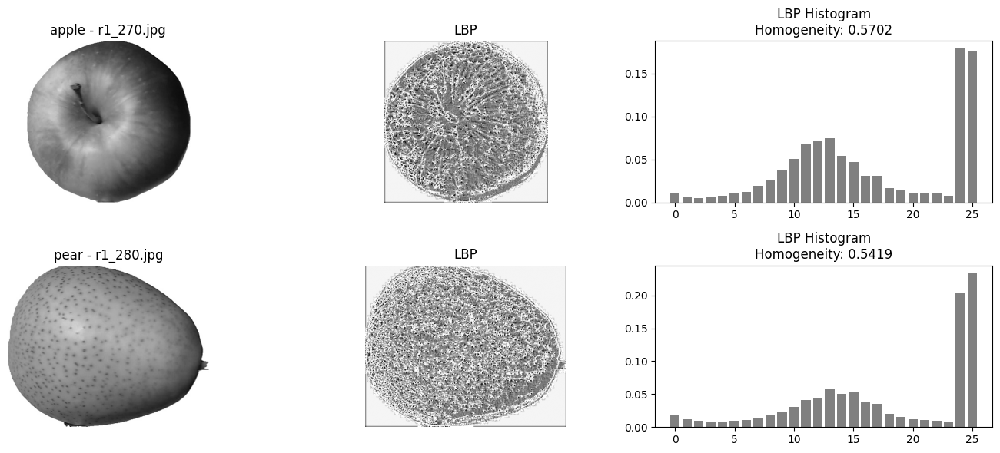

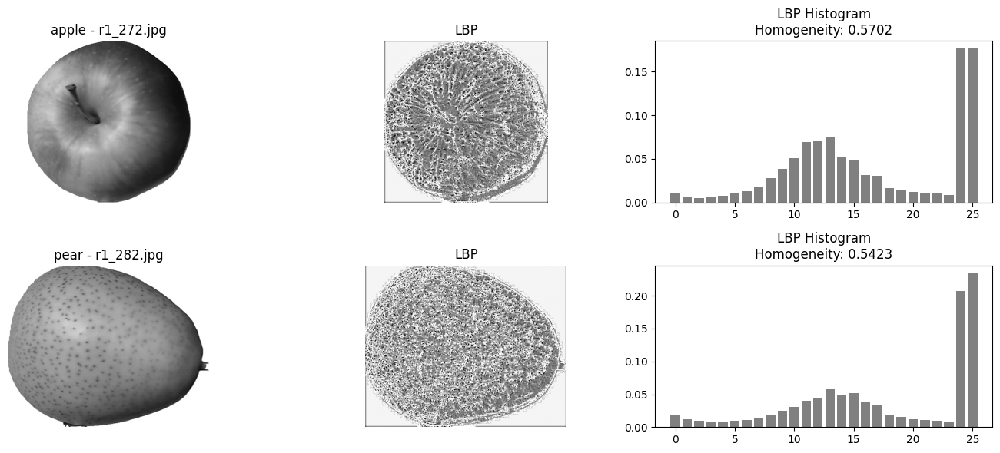

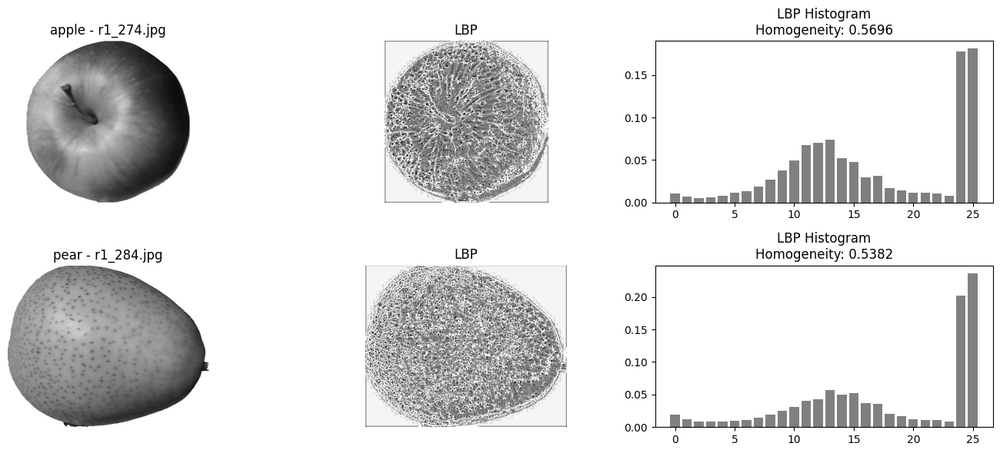

...

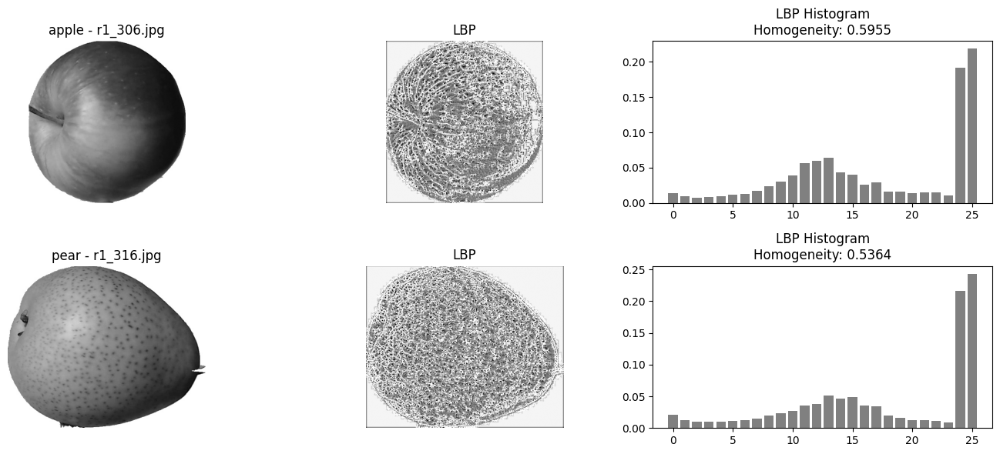

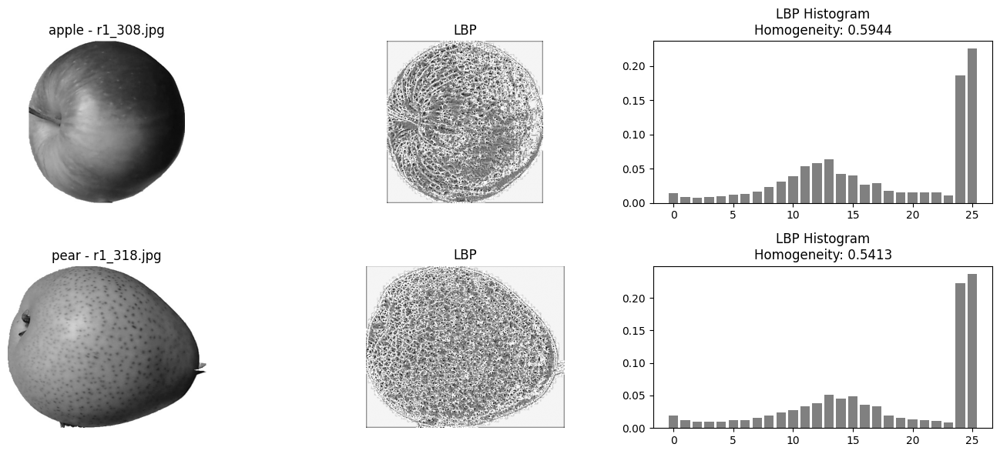

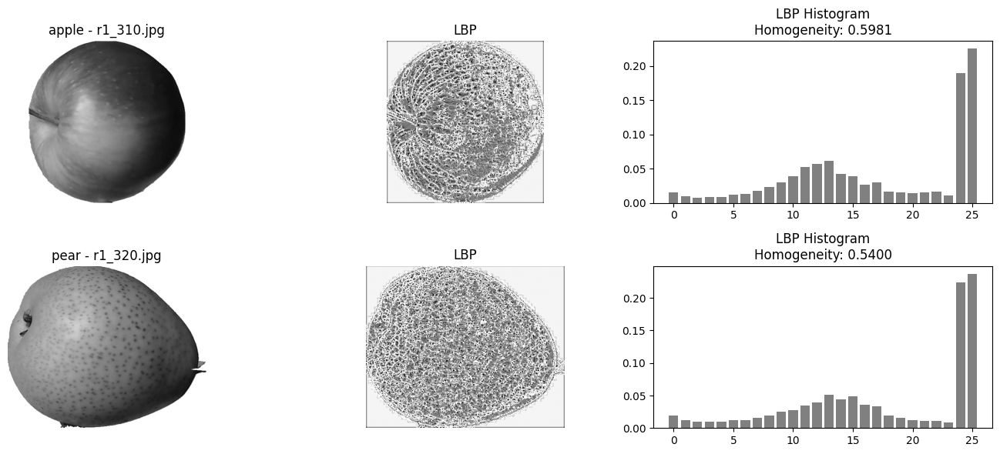

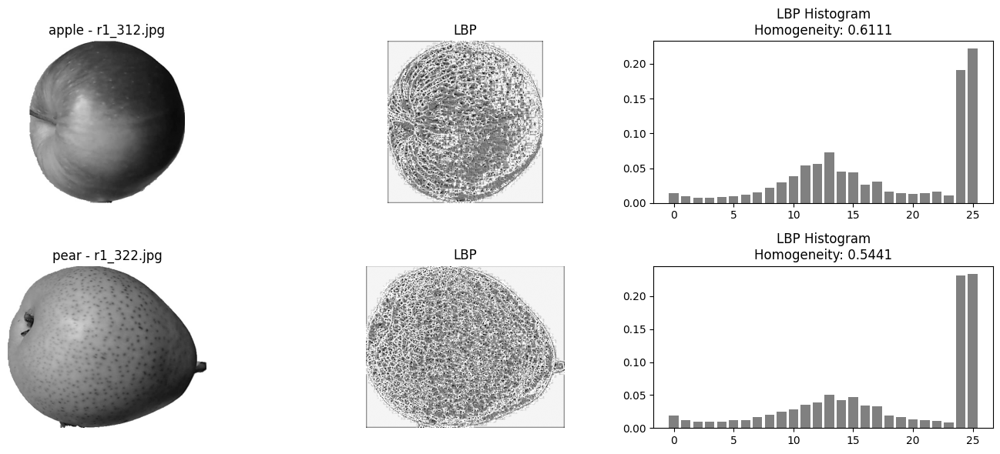

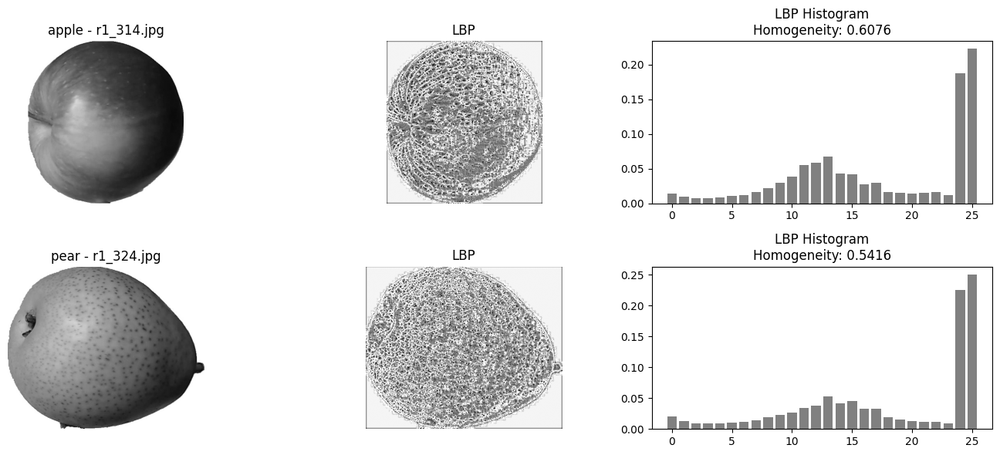

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from skimage.feature import graycomatrix, graycoprops, local_binary_pattern

folders = ["apple", "pear"]
valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp')

# Simpan ciri tiap folder
features = {folder: [] for folder in folders}

for folder in folders:
    for filename in os.listdir(folder):
        if filename.lower().endswith(valid_extensions):
            image_path = os.path.join(folder, filename)
            image_gray = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
            if image_gray is None:
                continue

            # --- 1. LBP ---
            radius = 3
            n_points = 8 * radius
            lbp = local_binary_pattern(image_gray, n_points, radius, method="uniform")
            lbp_hist, _ = np.histogram(lbp.ravel(),
                                       bins=np.arange(0, n_points + 3),
                                       range=(0, n_points + 2))
            lbp_hist = lbp_hist.astype("float")
            lbp_hist /= lbp_hist.sum()

            # --- 2. GLCM ---
            glcm = graycomatrix(image_gray,
                                distances=[1],
                                angles=[0, np.pi/4, np.pi/2, 3*np.pi/4],
                                levels=256,
                                symmetric=True,
                                normed=True)
            homogeneity = graycoprops(glcm, 'homogeneity').mean()

            # Simpan hasil ciri
            features[folder].append({
                "filename": filename,
                "lbp_hist": lbp_hist,
                "homogeneity": homogeneity,
                "lbp_image": lbp,
                "gray_image": image_gray
            })

# --- Visualisasi Perbandingan ---
for i in range(max(len(features["apple"]), len(features["pear"]))):
    plt.figure(figsize=(14, 6))
    
    for j, folder in enumerate(folders):
        if i < len(features[folder]):
            data = features[folder][i]
            plt.subplot(2, 3, j*3+1)
            plt.imshow(data["gray_image"], cmap='gray')
            plt.title(f"{folder} - {data['filename']}")
            plt.axis("off")
            
            plt.subplot(2, 3, j*3+2)
            plt.imshow(data["lbp_image"], cmap='gray')
            plt.title("LBP")
            plt.axis("off")
            
            plt.subplot(2, 3, j*3+3)
            plt.bar(range(len(data["lbp_hist"])), data["lbp_hist"], color='gray')
            plt.title(f"LBP Histogram\nHomogeneity: {data['homogeneity']:.4f}")
    
    plt.tight_layout()
    plt.show()

# ekstrasi ciri citra bentuk buah apel dan pear


Folder: apple, File: r1_266.jpg
 Kontur 1: Area=30.50, Perimeter=23.90, Circularity=0.6710
 Kontur 2: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 3: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 4: Area=2.50, Perimeter=8.24, Circularity=0.4624
 Kontur 5: Area=0.50, Perimeter=3.41, Circularity=0.5390
 Kontur 6: Area=0.50, Perimeter=5.41, Circularity=0.2143
 Kontur 7: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 8: Area=1.00, Perimeter=9.66, Circularity=0.1348
 Kontur 9: Area=14.00, Perimeter=21.31, Circularity=0.3873
 Kontur 10: Area=3.50, Perimeter=13.07, Circularity=0.2574
 Kontur 11: Area=5.50, Perimeter=10.24, Circularity=0.6588
 Kontur 12: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 13: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 14: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 15: Area=1.00, Perimeter=4.00, Circularity=0.7854
 Kontur 16: Area=0.50, Perimeter=3.41, Circularity=0.5390
 Kontur 17: Area=0.00, Perimeter=0.00, Cir

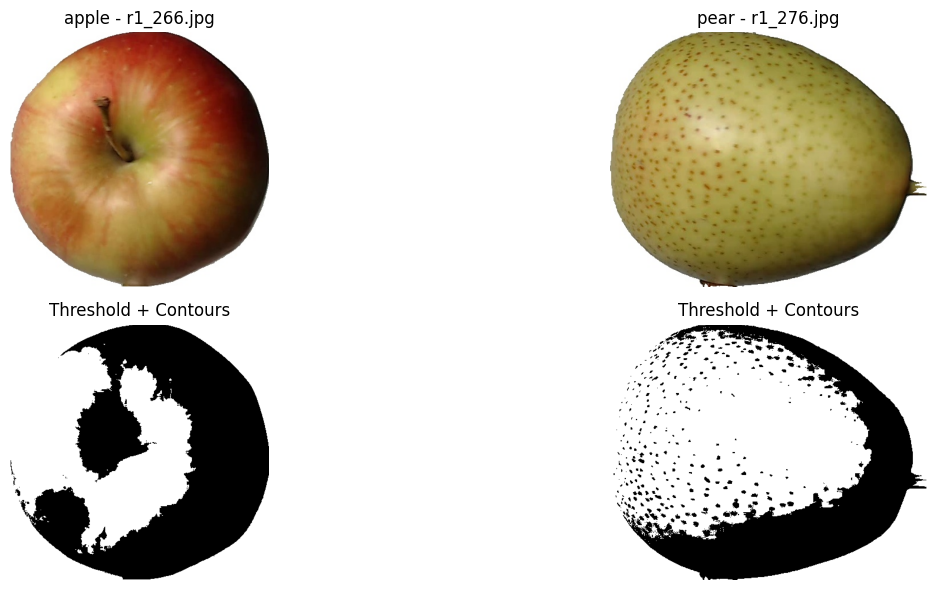


Folder: apple, File: r1_268.jpg
 Kontur 1: Area=204744.00, Perimeter=1810.00, Circularity=0.7854

Folder: pear, File: r1_278.jpg
 Kontur 1: Area=13.00, Perimeter=78.49, Circularity=0.0265
 Kontur 2: Area=29.00, Perimeter=25.31, Circularity=0.5687
 Kontur 3: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 4: Area=0.00, Perimeter=4.83, Circularity=0.0000
 Kontur 5: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 6: Area=0.00, Perimeter=4.00, Circularity=0.0000
 Kontur 7: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 8: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 9: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 10: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 11: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 12: Area=0.50, Perimeter=3.41, Circularity=0.5390
 Kontur 13: Area=25.00, Perimeter=38.97, Circularity=0.2069
 Kontur 14: Area=2.00, Perimeter=6.00, Circularity=0.6981
 Kontur 15: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Ko

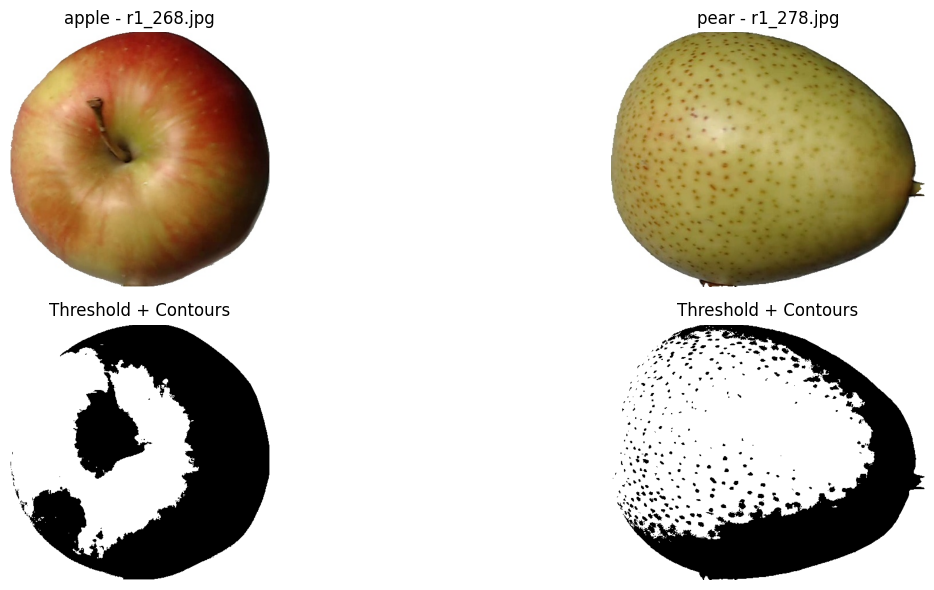


Folder: apple, File: r1_270.jpg
 Kontur 1: Area=204754.00, Perimeter=1810.00, Circularity=0.7854

Folder: pear, File: r1_280.jpg
 Kontur 1: Area=10.00, Perimeter=79.66, Circularity=0.0198
 Kontur 2: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 3: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 4: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 5: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 6: Area=0.50, Perimeter=3.41, Circularity=0.5390
 Kontur 7: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 8: Area=0.00, Perimeter=2.83, Circularity=0.0000
 Kontur 9: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 10: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 11: Area=0.50, Perimeter=3.41, Circularity=0.5390
 Kontur 12: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 13: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 14: Area=16.50, Perimeter=19.07, Circularity=0.5701
 Kontur 15: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kont

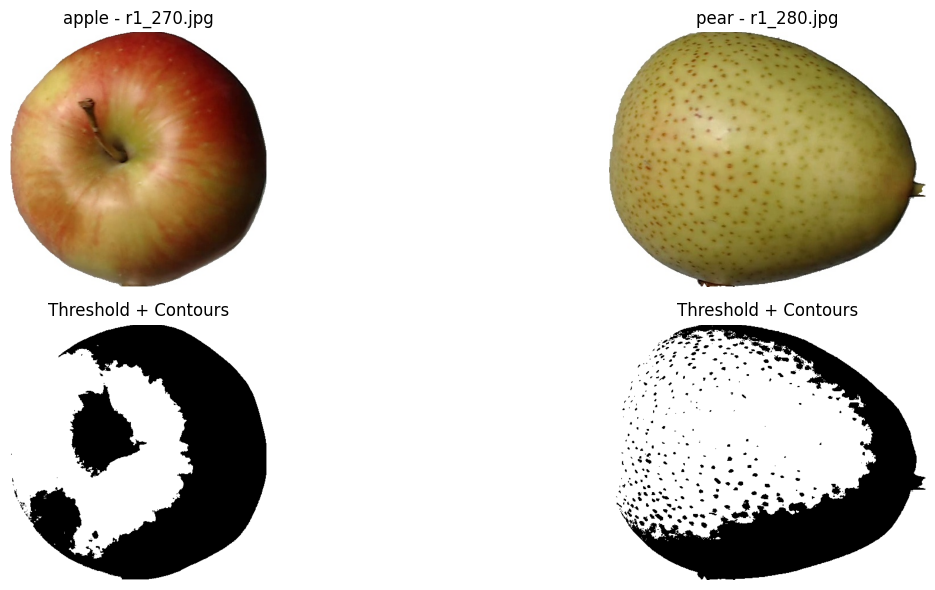


Folder: apple, File: r1_272.jpg
 Kontur 1: Area=203850.00, Perimeter=1806.00, Circularity=0.7854

Folder: pear, File: r1_282.jpg
 Kontur 1: Area=7.00, Perimeter=81.66, Circularity=0.0132
 Kontur 2: Area=21.50, Perimeter=21.07, Circularity=0.6085
 Kontur 3: Area=0.00, Perimeter=2.83, Circularity=0.0000
 Kontur 4: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 5: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 6: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 7: Area=1.00, Perimeter=4.00, Circularity=0.7854
 Kontur 8: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 9: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 10: Area=0.50, Perimeter=5.41, Circularity=0.2143
 Kontur 11: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 12: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 13: Area=0.50, Perimeter=3.41, Circularity=0.5390
 Kontur 14: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 15: Area=1.50, Perimeter=8.24, Circularity=0.2774
 Kontu

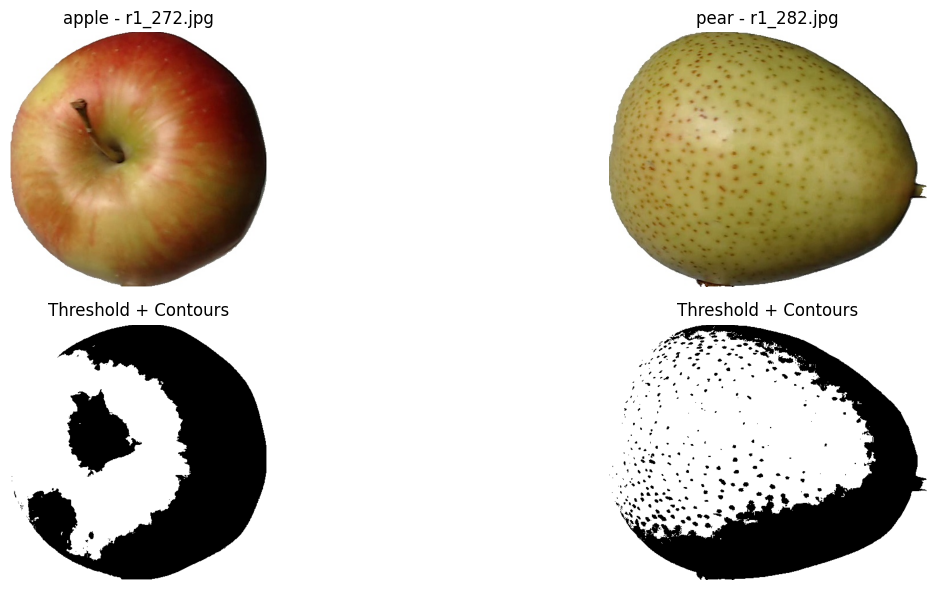


Folder: apple, File: r1_274.jpg
 Kontur 1: Area=203850.00, Perimeter=1806.00, Circularity=0.7854

Folder: pear, File: r1_284.jpg
 Kontur 1: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 2: Area=14.00, Perimeter=51.66, Circularity=0.0659
 Kontur 3: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 4: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 5: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 6: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 7: Area=1.50, Perimeter=5.41, Circularity=0.6430
 Kontur 8: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 9: Area=2.00, Perimeter=6.00, Circularity=0.6981
 Kontur 10: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 11: Area=2.50, Perimeter=7.41, Circularity=0.5715
 Kontur 12: Area=1.00, Perimeter=6.83, Circularity=0.2695
 Kontur 13: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 14: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 15: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur

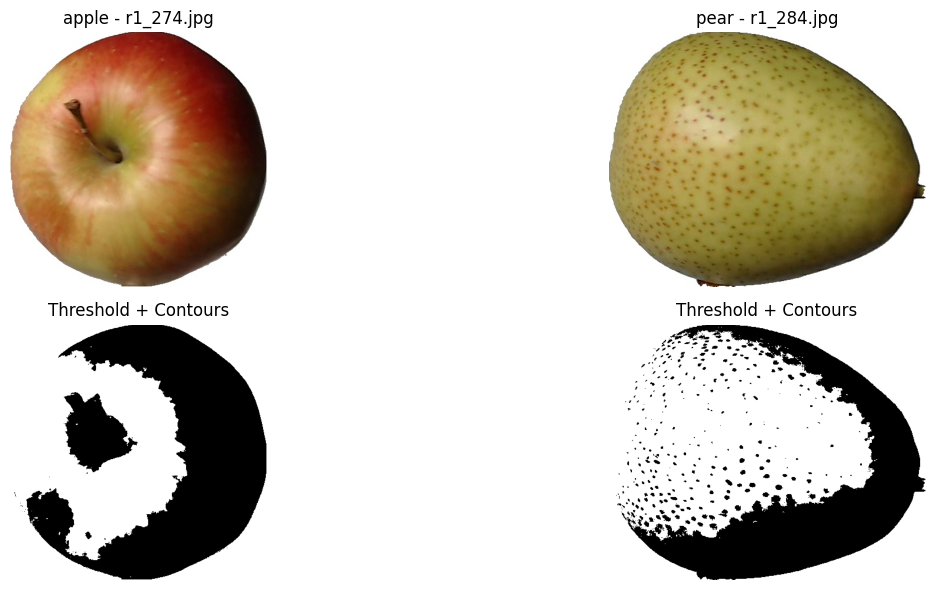


Folder: apple, File: r1_276.jpg
 Kontur 1: Area=202948.00, Perimeter=1802.00, Circularity=0.7854

Folder: pear, File: r1_286.jpg
 Kontur 1: Area=6.00, Perimeter=14.83, Circularity=0.3429
 Kontur 2: Area=10.00, Perimeter=38.83, Circularity=0.0834
 Kontur 3: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 4: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 5: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 6: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 7: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 8: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 9: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 10: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 11: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 12: Area=0.00, Perimeter=6.00, Circularity=0.0000
 Kontur 13: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 14: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 15: Area=11.50, Perimeter=19.90, Circularity=0.3649
 Kon

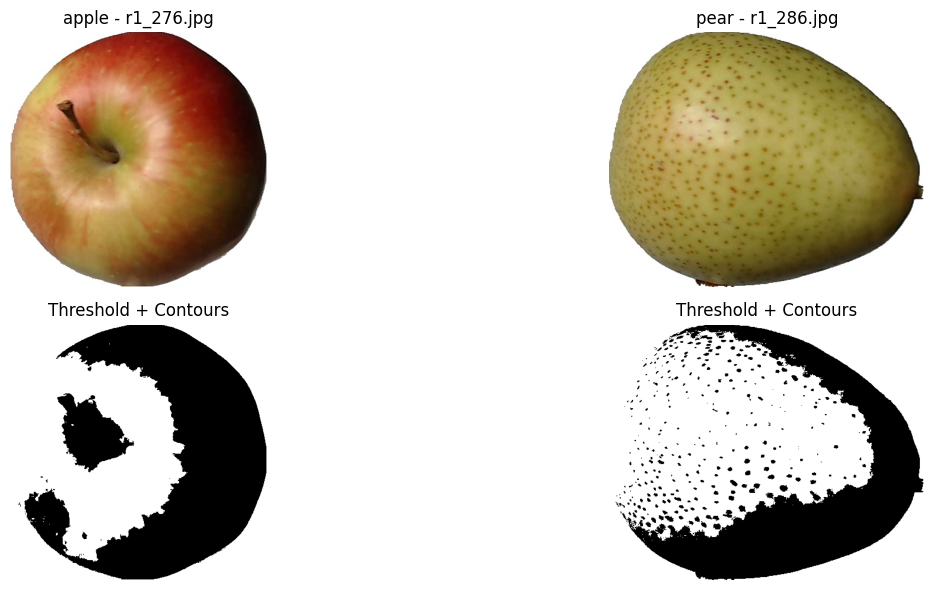


Folder: apple, File: r1_278.jpg
 Kontur 1: Area=202950.00, Perimeter=1802.00, Circularity=0.7854

Folder: pear, File: r1_288.jpg
 Kontur 1: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 2: Area=1.50, Perimeter=10.24, Circularity=0.1797
 Kontur 3: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 4: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 5: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 6: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 7: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 8: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 9: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 10: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 11: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 12: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 13: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 14: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 15: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 

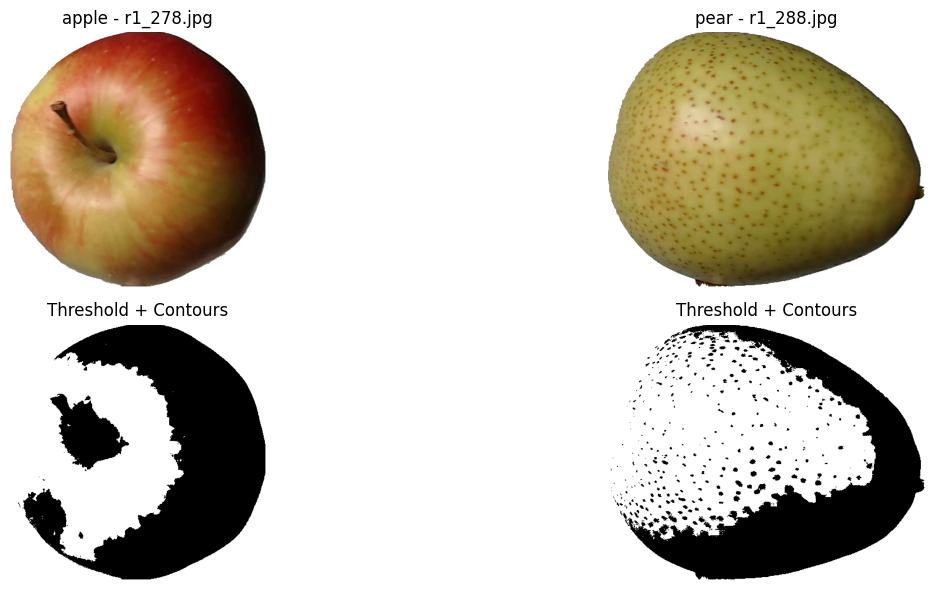


Folder: apple, File: r1_280.jpg
 Kontur 1: Area=202500.00, Perimeter=1800.00, Circularity=0.7854

Folder: pear, File: r1_290.jpg
 Kontur 1: Area=19.00, Perimeter=55.66, Circularity=0.0771
 Kontur 2: Area=0.50, Perimeter=3.41, Circularity=0.5390
 Kontur 3: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 4: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 5: Area=0.50, Perimeter=3.41, Circularity=0.5390
 Kontur 6: Area=4.50, Perimeter=9.41, Circularity=0.6380
 Kontur 7: Area=0.00, Perimeter=2.83, Circularity=0.0000
 Kontur 8: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 9: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 10: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 11: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 12: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 13: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 14: Area=0.50, Perimeter=3.41, Circularity=0.5390
 Kontur 15: Area=2.00, Perimeter=8.83, Circularity=0.3225
 Kontur

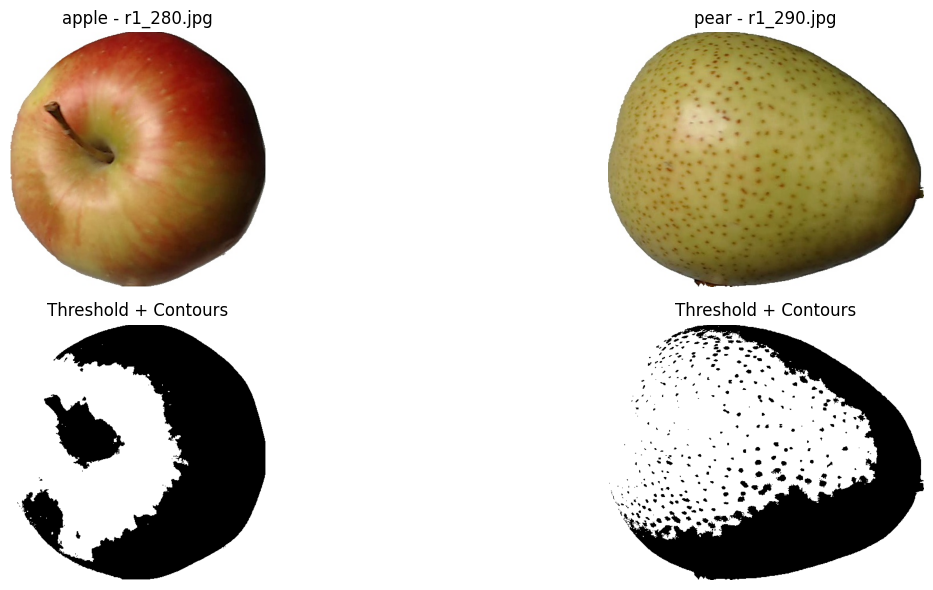


Folder: apple, File: r1_282.jpg
 Kontur 1: Area=201601.00, Perimeter=1796.00, Circularity=0.7854

Folder: pear, File: r1_292.jpg
 Kontur 1: Area=19.00, Perimeter=63.31, Circularity=0.0596
 Kontur 2: Area=0.00, Perimeter=4.00, Circularity=0.0000
 Kontur 3: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 4: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 5: Area=0.00, Perimeter=2.83, Circularity=0.0000
 Kontur 6: Area=1.00, Perimeter=7.66, Circularity=0.2143
 Kontur 7: Area=0.00, Perimeter=4.83, Circularity=0.0000
 Kontur 8: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 9: Area=0.50, Perimeter=3.41, Circularity=0.5390
 Kontur 10: Area=0.00, Perimeter=4.00, Circularity=0.0000
 Kontur 11: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 12: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 13: Area=1.00, Perimeter=4.00, Circularity=0.7854
 Kontur 14: Area=13253.50, Perimeter=882.09, Circularity=0.2140
 Kontur 15: Area=0.00, Perimeter=0.00, Circularity=0.0000
 

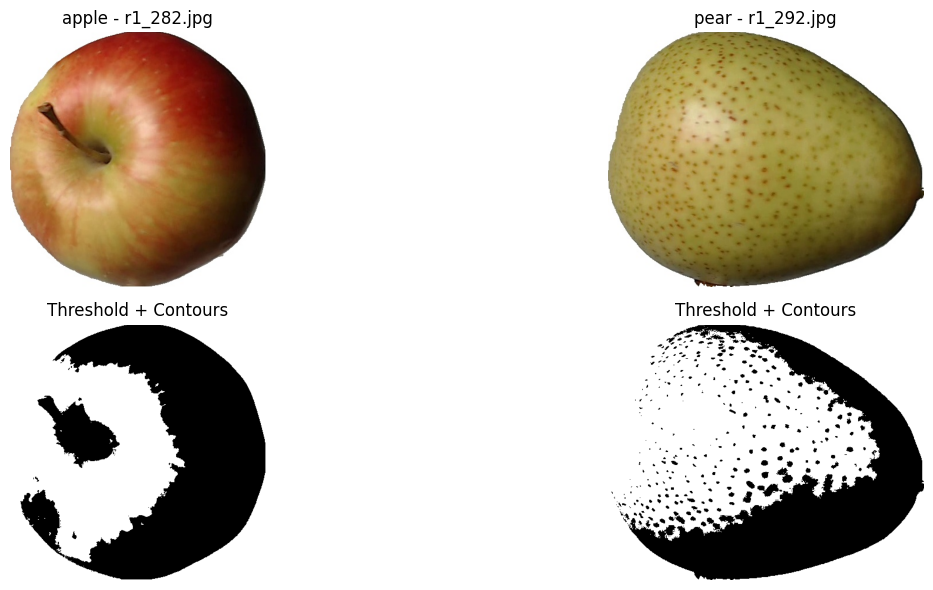


Folder: apple, File: r1_284.jpg
 Kontur 1: Area=201152.00, Perimeter=1794.00, Circularity=0.7854

Folder: pear, File: r1_294.jpg
 Kontur 1: Area=0.50, Perimeter=3.41, Circularity=0.5390
 Kontur 2: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 3: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 4: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 5: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 6: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 7: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 8: Area=2.00, Perimeter=6.83, Circularity=0.5390
 Kontur 9: Area=1.00, Perimeter=4.00, Circularity=0.7854
 Kontur 10: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 11: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 12: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 13: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 14: Area=5.50, Perimeter=23.07, Circularity=0.1298
 Kontur 15: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 

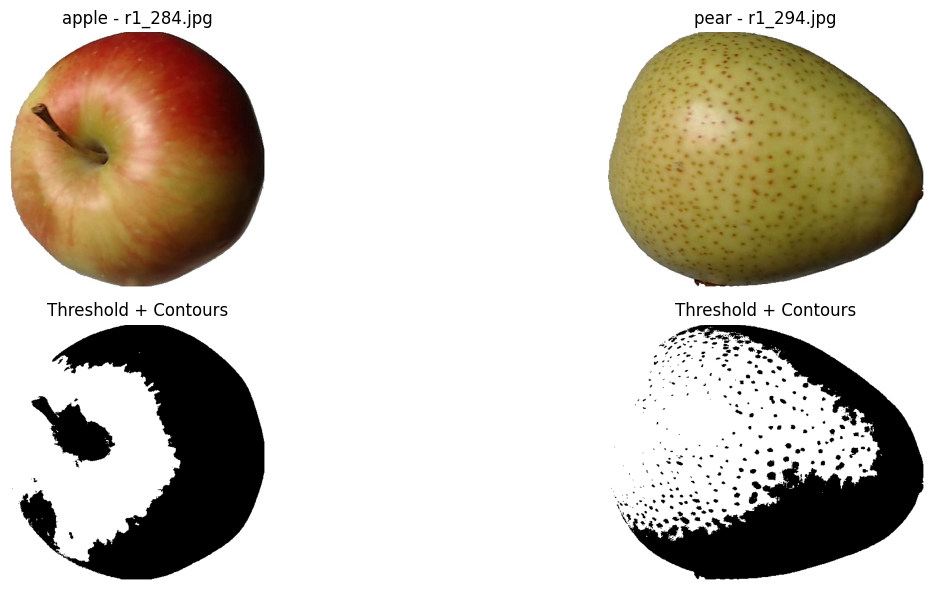


Folder: apple, File: r1_286.jpg
 Kontur 1: Area=201597.00, Perimeter=1796.00, Circularity=0.7854

Folder: pear, File: r1_296.jpg
 Kontur 1: Area=0.50, Perimeter=3.41, Circularity=0.5390
 Kontur 2: Area=0.00, Perimeter=4.00, Circularity=0.0000
 Kontur 3: Area=14.50, Perimeter=31.90, Circularity=0.1791
 Kontur 4: Area=0.50, Perimeter=3.41, Circularity=0.5390
 Kontur 5: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 6: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 7: Area=0.00, Perimeter=4.00, Circularity=0.0000
 Kontur 8: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 9: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 10: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 11: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 12: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 13: Area=64.00, Perimeter=47.80, Circularity=0.3520
 Kontur 14: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 15: Area=8.00, Perimeter=18.14, Circularity=0.3054
 Kon

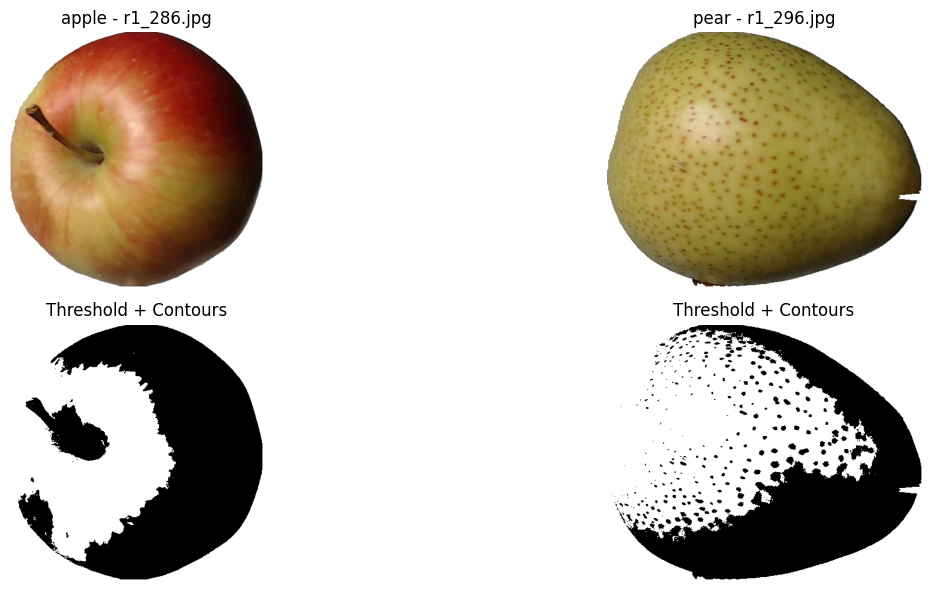


Folder: apple, File: r1_288.jpg
 Kontur 1: Area=200250.00, Perimeter=1790.00, Circularity=0.7854

Folder: pear, File: r1_298.jpg
 Kontur 1: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 2: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 3: Area=3.50, Perimeter=14.24, Circularity=0.2168
 Kontur 4: Area=0.00, Perimeter=2.83, Circularity=0.0000
 Kontur 5: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 6: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 7: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 8: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 9: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 10: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 11: Area=0.50, Perimeter=3.41, Circularity=0.5390
 Kontur 12: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 13: Area=1.00, Perimeter=4.00, Circularity=0.7854
 Kontur 14: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 15: Area=7.00, Perimeter=14.49, Circularity=0.4192
 Kontur

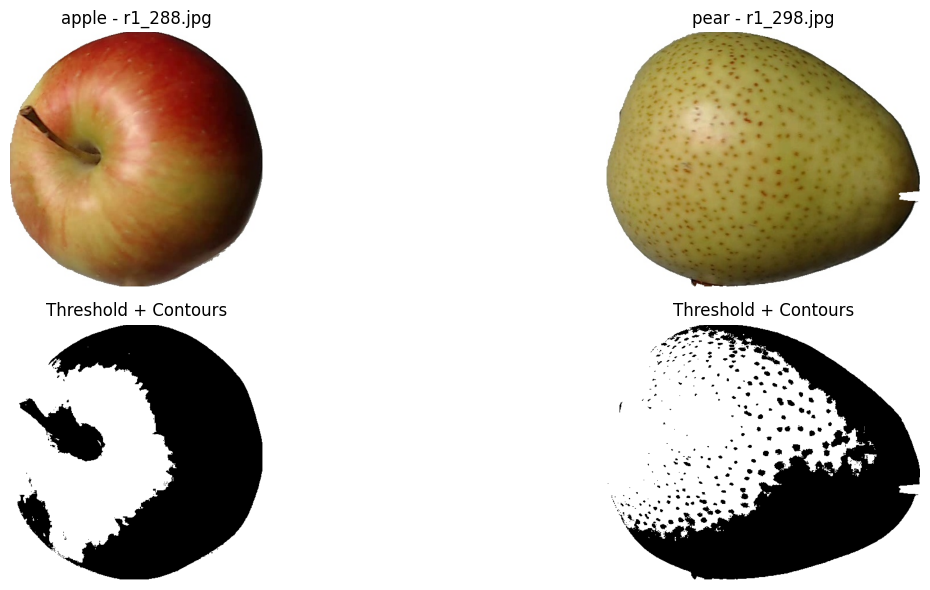


Folder: apple, File: r1_290.jpg
 Kontur 1: Area=200244.00, Perimeter=1790.00, Circularity=0.7854

Folder: pear, File: r1_300.jpg
 Kontur 1: Area=22.00, Perimeter=72.49, Circularity=0.0526
 Kontur 2: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 3: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 4: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 5: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 6: Area=1.50, Perimeter=5.41, Circularity=0.6430
 Kontur 7: Area=0.50, Perimeter=3.41, Circularity=0.5390
 Kontur 8: Area=19.50, Perimeter=39.21, Circularity=0.1594
 Kontur 9: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 10: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 11: Area=3.00, Perimeter=6.83, Circularity=0.8085
 Kontur 12: Area=0.50, Perimeter=3.41, Circularity=0.5390
 Kontur 13: Area=2.00, Perimeter=6.00, Circularity=0.6981
 Kontur 14: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 15: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kont

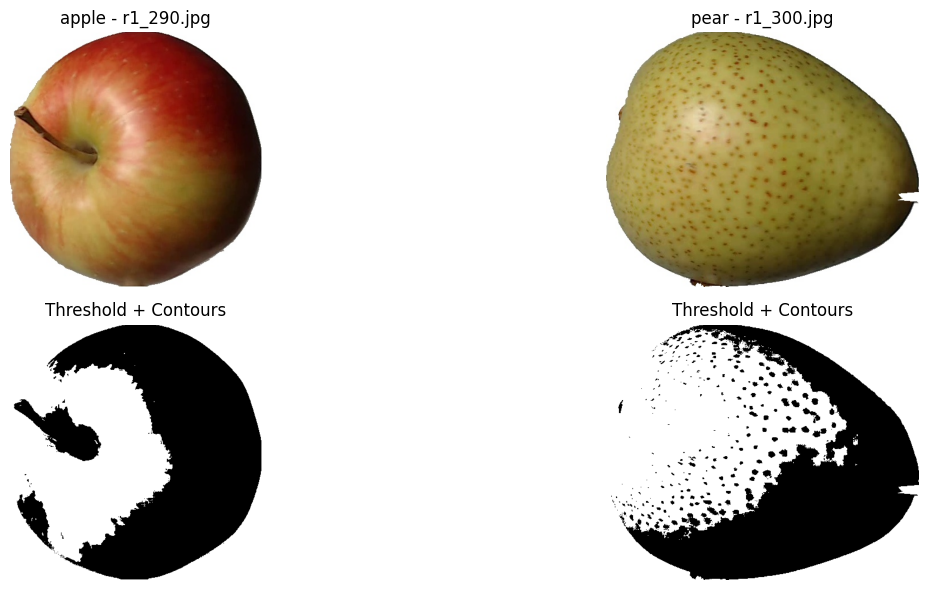


Folder: apple, File: r1_292.jpg
 Kontur 1: Area=200688.00, Perimeter=1792.00, Circularity=0.7853

Folder: pear, File: r1_302.jpg
 Kontur 1: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 2: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 3: Area=2.00, Perimeter=6.00, Circularity=0.6981
 Kontur 4: Area=0.00, Perimeter=2.83, Circularity=0.0000
 Kontur 5: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 6: Area=0.50, Perimeter=6.24, Circularity=0.1612
 Kontur 7: Area=0.50, Perimeter=6.24, Circularity=0.1612
 Kontur 8: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 9: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 10: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 11: Area=0.00, Perimeter=6.00, Circularity=0.0000
 Kontur 12: Area=404.50, Perimeter=98.38, Circularity=0.5251
 Kontur 13: Area=2.50, Perimeter=10.24, Circularity=0.2995
 Kontur 14: Area=0.00, Perimeter=18.00, Circularity=0.0000
 Kontur 15: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kon

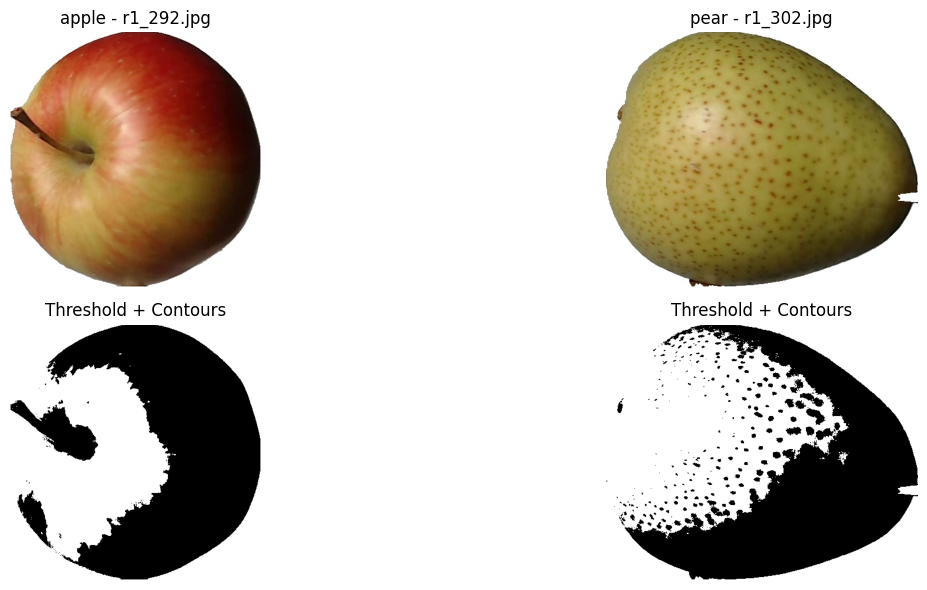


Folder: apple, File: r1_294.jpg
 Kontur 1: Area=200244.00, Perimeter=1790.00, Circularity=0.7854

Folder: pear, File: r1_304.jpg
 Kontur 1: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 2: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 3: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 4: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 5: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 6: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 7: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 8: Area=0.00, Perimeter=4.00, Circularity=0.0000
 Kontur 9: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 10: Area=1.50, Perimeter=7.41, Circularity=0.3429
 Kontur 11: Area=0.00, Perimeter=4.00, Circularity=0.0000
 Kontur 12: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 13: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 14: Area=1.50, Perimeter=5.41, Circularity=0.6430
 Kontur 15: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 1

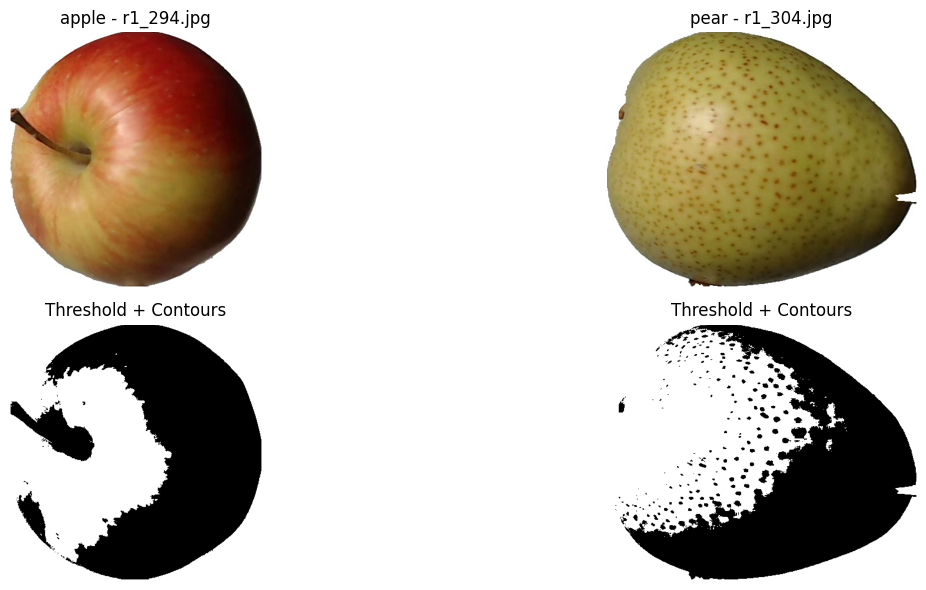


Folder: apple, File: r1_296.jpg
 Kontur 1: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 2: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 3: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 4: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 5: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 6: Area=1.50, Perimeter=6.24, Circularity=0.4837
 Kontur 7: Area=4.00, Perimeter=8.83, Circularity=0.6449
 Kontur 8: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 9: Area=2.00, Perimeter=6.83, Circularity=0.5390
 Kontur 10: Area=106885.50, Perimeter=3941.96, Circularity=0.0864

Folder: pear, File: r1_306.jpg
 Kontur 1: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 2: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 3: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 4: Area=0.00, Perimeter=2.83, Circularity=0.0000
 Kontur 5: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 6: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 7: Are

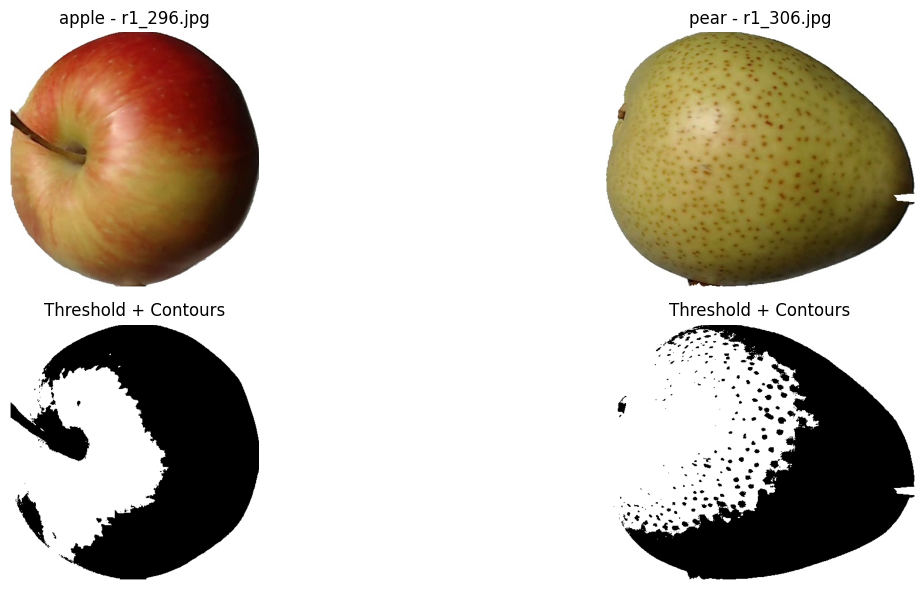


Folder: apple, File: r1_298.jpg
 Kontur 1: Area=1.50, Perimeter=5.41, Circularity=0.6430
 Kontur 2: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 3: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 4: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 5: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 6: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 7: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 8: Area=0.00, Perimeter=4.00, Circularity=0.0000
 Kontur 9: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 10: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 11: Area=1.00, Perimeter=4.00, Circularity=0.7854
 Kontur 12: Area=18.00, Perimeter=20.49, Circularity=0.5390
 Kontur 13: Area=6.00, Perimeter=11.66, Circularity=0.5549
 Kontur 14: Area=4.00, Perimeter=9.66, Circularity=0.5390
 Kontur 15: Area=105062.50, Perimeter=3984.79, Circularity=0.0831

Folder: pear, File: r1_308.jpg
 Kontur 1: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontu

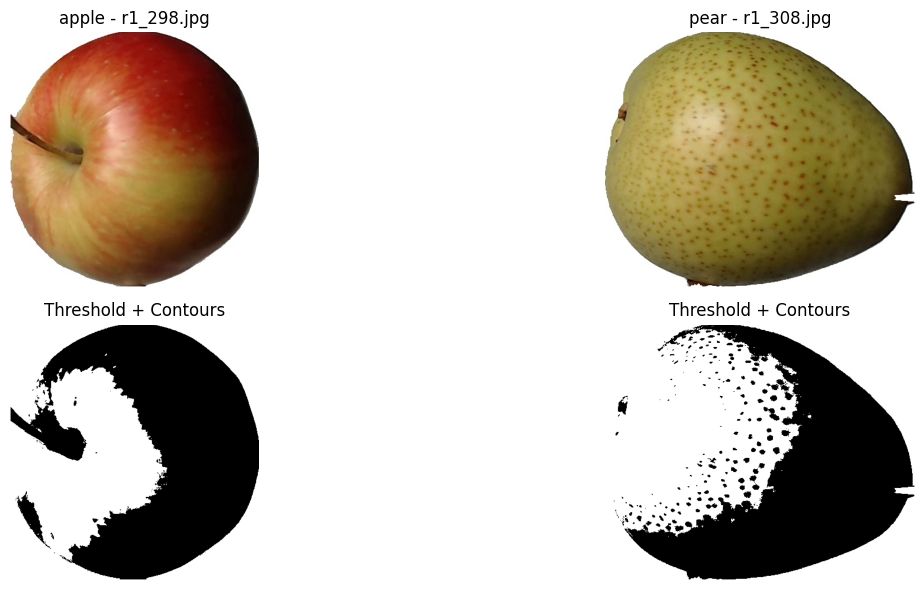


Folder: apple, File: r1_300.jpg
 Kontur 1: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 2: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 3: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 4: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 5: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 6: Area=24.50, Perimeter=26.73, Circularity=0.4310
 Kontur 7: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 8: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 9: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 10: Area=0.50, Perimeter=8.24, Circularity=0.0925
 Kontur 11: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 12: Area=10.00, Perimeter=17.31, Circularity=0.4192
 Kontur 13: Area=8.00, Perimeter=13.66, Circularity=0.5390
 Kontur 14: Area=4.50, Perimeter=10.24, Circularity=0.5390
 Kontur 15: Area=96037.50, Perimeter=4438.72, Circularity=0.0613

Folder: pear, File: r1_310.jpg
 Kontur 1: Area=99.50, Perimeter=124.87, Circularity=0.0802
 

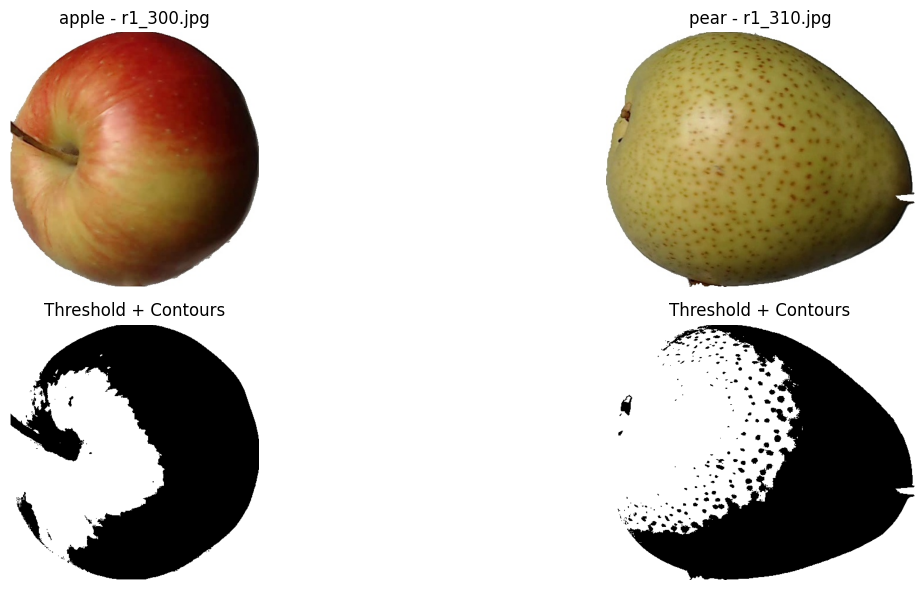


Folder: apple, File: r1_302.jpg
 Kontur 1: Area=0.00, Perimeter=4.00, Circularity=0.0000
 Kontur 2: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 3: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 4: Area=1.00, Perimeter=6.83, Circularity=0.2695
 Kontur 5: Area=0.00, Perimeter=4.83, Circularity=0.0000
 Kontur 6: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 7: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 8: Area=9.00, Perimeter=16.49, Circularity=0.4162
 Kontur 9: Area=9.50, Perimeter=13.07, Circularity=0.6987
 Kontur 10: Area=3.50, Perimeter=8.24, Circularity=0.6474
 Kontur 11: Area=93405.00, Perimeter=4424.07, Circularity=0.0600

Folder: pear, File: r1_312.jpg
 Kontur 1: Area=81.50, Perimeter=122.53, Circularity=0.0682
 Kontur 2: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 3: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 4: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 5: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 6

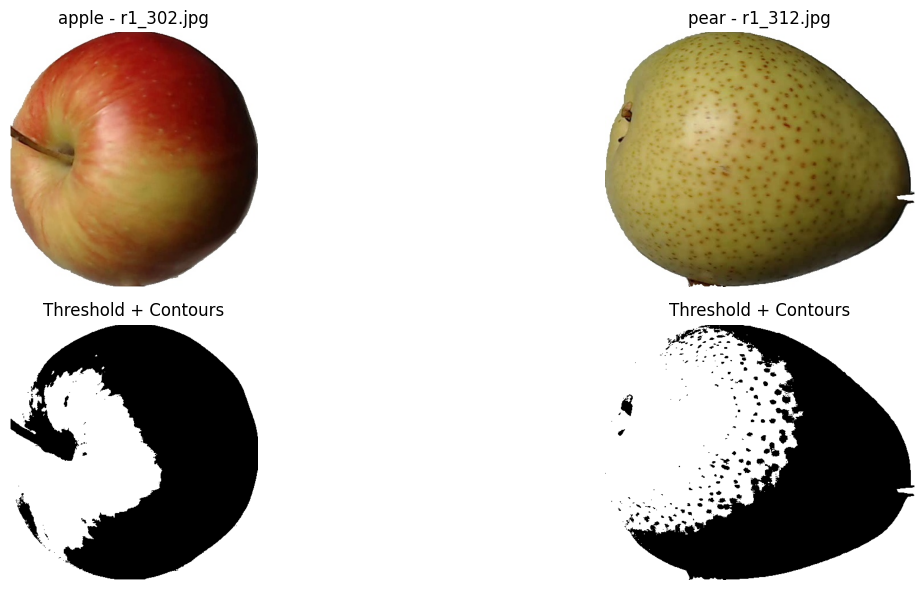


Folder: apple, File: r1_304.jpg
 Kontur 1: Area=9.50, Perimeter=12.24, Circularity=0.7965
 Kontur 2: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 3: Area=0.00, Perimeter=4.00, Circularity=0.0000
 Kontur 4: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 5: Area=17.00, Perimeter=18.49, Circularity=0.6252
 Kontur 6: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 7: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 8: Area=1.00, Perimeter=4.00, Circularity=0.7854
 Kontur 9: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 10: Area=1.50, Perimeter=5.41, Circularity=0.6430
 Kontur 11: Area=8.50, Perimeter=15.90, Circularity=0.4225
 Kontur 12: Area=8.50, Perimeter=13.07, Circularity=0.6252
 Kontur 13: Area=2.50, Perimeter=7.41, Circularity=0.5715
 Kontur 14: Area=91914.50, Perimeter=4546.74, Circularity=0.0559

Folder: pear, File: r1_314.jpg
 Kontur 1: Area=106.50, Perimeter=127.36, Circularity=0.0825
 Kontur 2: Area=0.50, Perimeter=8.24, Circularity=0.0925
 K

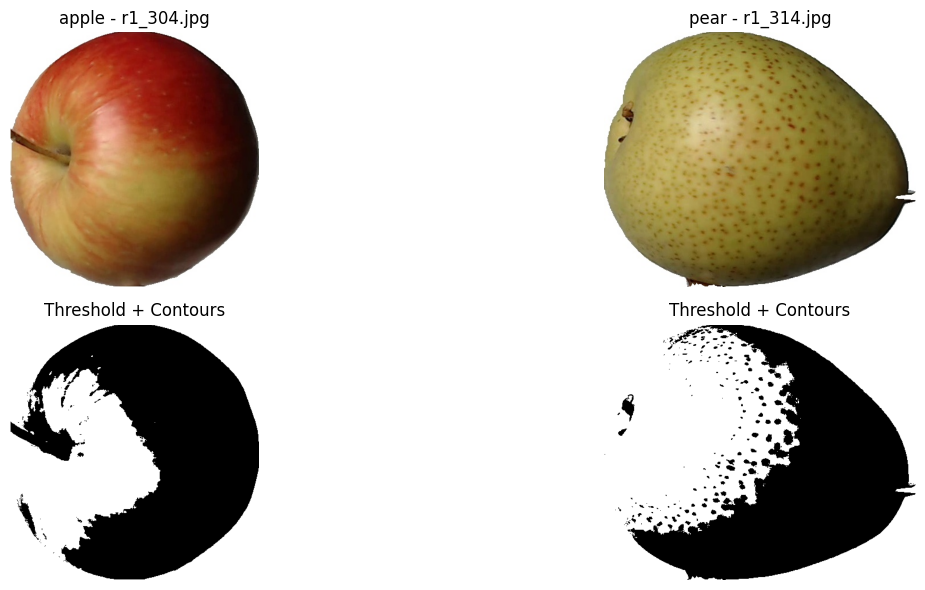


Folder: apple, File: r1_306.jpg
 Kontur 1: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 2: Area=0.00, Perimeter=4.00, Circularity=0.0000
 Kontur 3: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 4: Area=1.00, Perimeter=6.83, Circularity=0.2695
 Kontur 5: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 6: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 7: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 8: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 9: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 10: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 11: Area=17.50, Perimeter=19.90, Circularity=0.5553
 Kontur 12: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 13: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 14: Area=0.00, Perimeter=4.00, Circularity=0.0000
 Kontur 15: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 16: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 17: Area=0.00, Perimeter=0.00, Circula

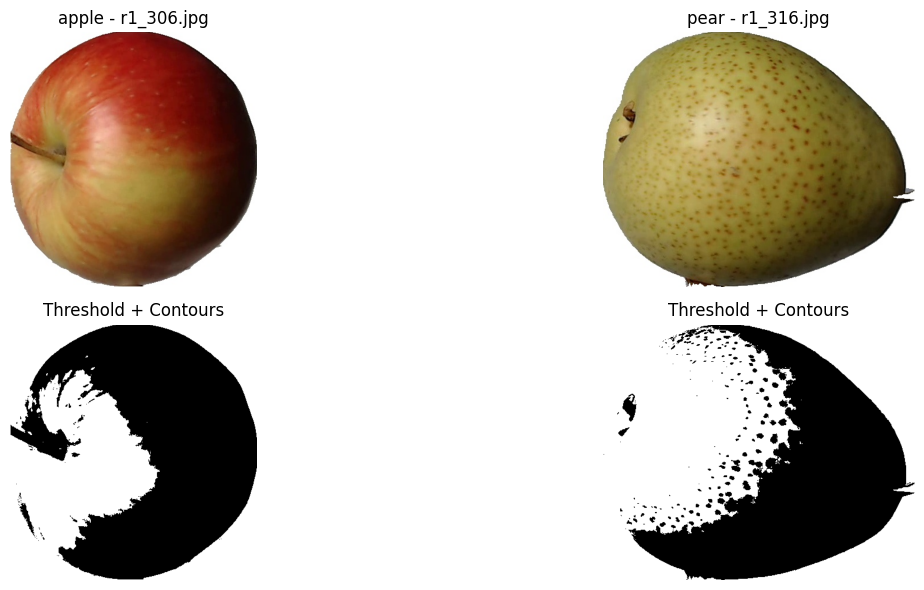


Folder: apple, File: r1_308.jpg
 Kontur 1: Area=0.00, Perimeter=6.00, Circularity=0.0000
 Kontur 2: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 3: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 4: Area=2.00, Perimeter=6.83, Circularity=0.5390
 Kontur 5: Area=0.00, Perimeter=4.83, Circularity=0.0000
 Kontur 6: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 7: Area=19.00, Perimeter=20.14, Circularity=0.5885
 Kontur 8: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 9: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 10: Area=0.50, Perimeter=3.41, Circularity=0.5390
 Kontur 11: Area=5.00, Perimeter=9.66, Circularity=0.6738
 Kontur 12: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 13: Area=2.50, Perimeter=7.41, Circularity=0.5715
 Kontur 14: Area=0.50, Perimeter=3.41, Circularity=0.5390
 Kontur 15: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 16: Area=3.00, Perimeter=9.66, Circularity=0.4043
 Kontur 17: Area=0.00, Perimeter=0.00, Circula

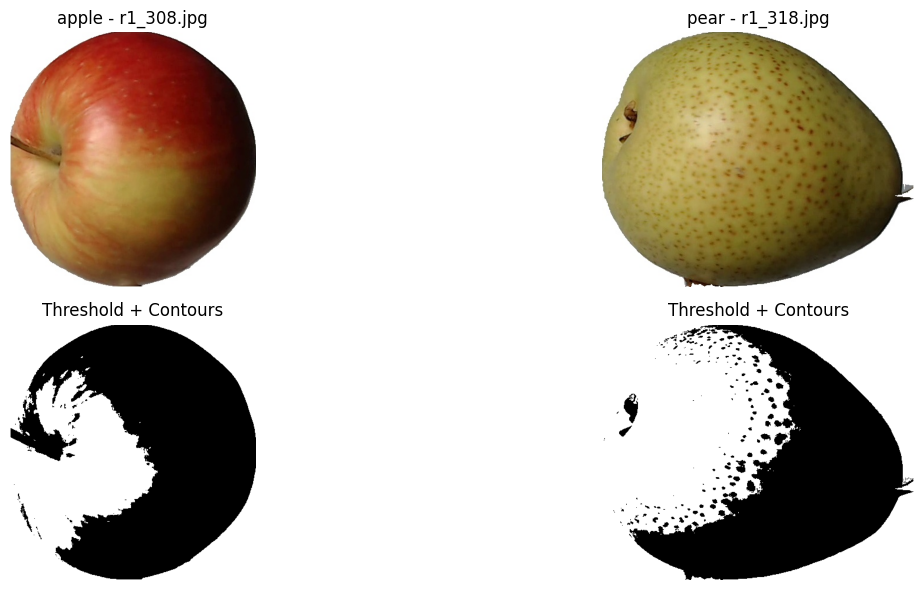


Folder: apple, File: r1_310.jpg
 Kontur 1: Area=196185.00, Perimeter=1772.00, Circularity=0.7851

Folder: pear, File: r1_320.jpg
 Kontur 1: Area=2.00, Perimeter=6.83, Circularity=0.5390
 Kontur 2: Area=99.50, Perimeter=108.53, Circularity=0.1062
 Kontur 3: Area=0.50, Perimeter=5.41, Circularity=0.2143
 Kontur 4: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 5: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 6: Area=0.50, Perimeter=3.41, Circularity=0.5390
 Kontur 7: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 8: Area=3.00, Perimeter=14.49, Circularity=0.1797
 Kontur 9: Area=1.50, Perimeter=7.41, Circularity=0.3429
 Kontur 10: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 11: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 12: Area=45.50, Perimeter=39.56, Circularity=0.3654
 Kontur 13: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 14: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 15: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Ko

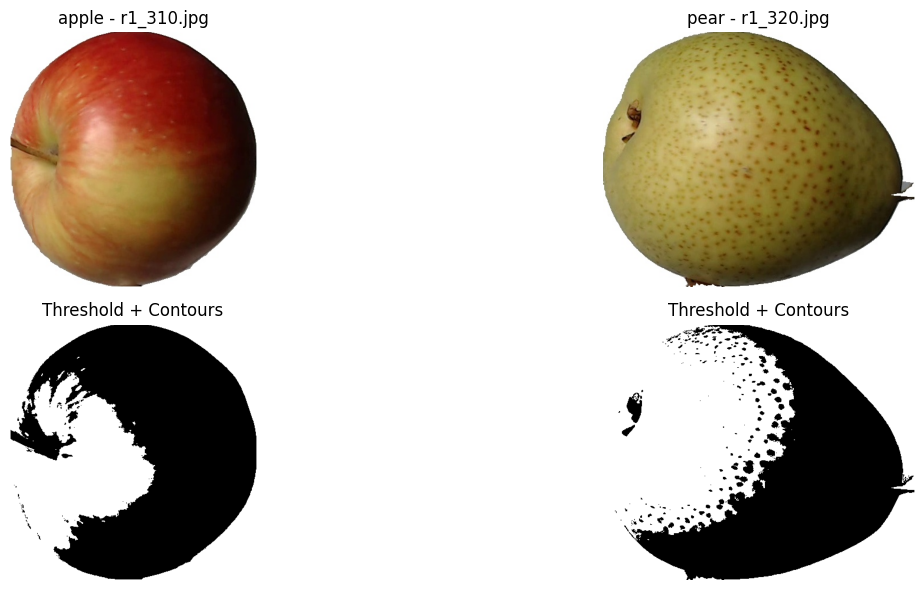


Folder: apple, File: r1_312.jpg
 Kontur 1: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 2: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 3: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 4: Area=0.00, Perimeter=4.00, Circularity=0.0000
 Kontur 5: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 6: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 7: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 8: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 9: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 10: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 11: Area=2.00, Perimeter=6.83, Circularity=0.5390
 Kontur 12: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 13: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 14: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 15: Area=3.00, Perimeter=19.66, Circularity=0.0976
 Kontur 16: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 17: Area=0.00, Perimeter=4.00, Circular

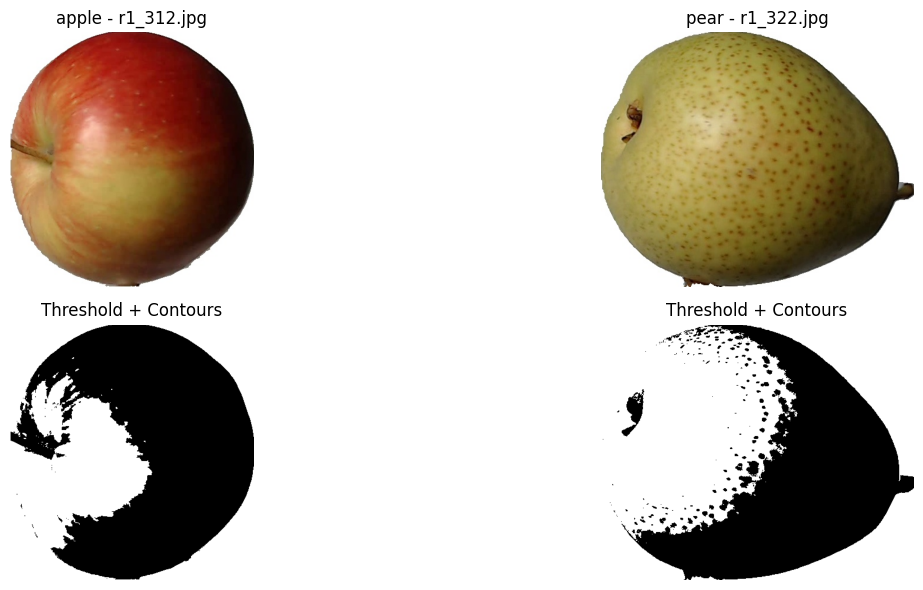


Folder: apple, File: r1_314.jpg
 Kontur 1: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 2: Area=1.00, Perimeter=4.83, Circularity=0.5390
 Kontur 3: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 4: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 5: Area=5.00, Perimeter=11.66, Circularity=0.4624
 Kontur 6: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 7: Area=1.50, Perimeter=5.41, Circularity=0.6430
 Kontur 8: Area=2.00, Perimeter=16.49, Circularity=0.0925
 Kontur 9: Area=0.00, Perimeter=6.83, Circularity=0.0000
 Kontur 10: Area=20.50, Perimeter=28.38, Circularity=0.3197
 Kontur 11: Area=5.00, Perimeter=12.49, Circularity=0.4031
 Kontur 12: Area=14.50, Perimeter=16.24, Circularity=0.6907
 Kontur 13: Area=2.50, Perimeter=8.24, Circularity=0.4624
 Kontur 14: Area=0.00, Perimeter=2.00, Circularity=0.0000
 Kontur 15: Area=0.00, Perimeter=0.00, Circularity=0.0000
 Kontur 16: Area=16.00, Perimeter=19.31, Circularity=0.5390
 Kontur 17: Area=0.00, Perimeter=0.00, 

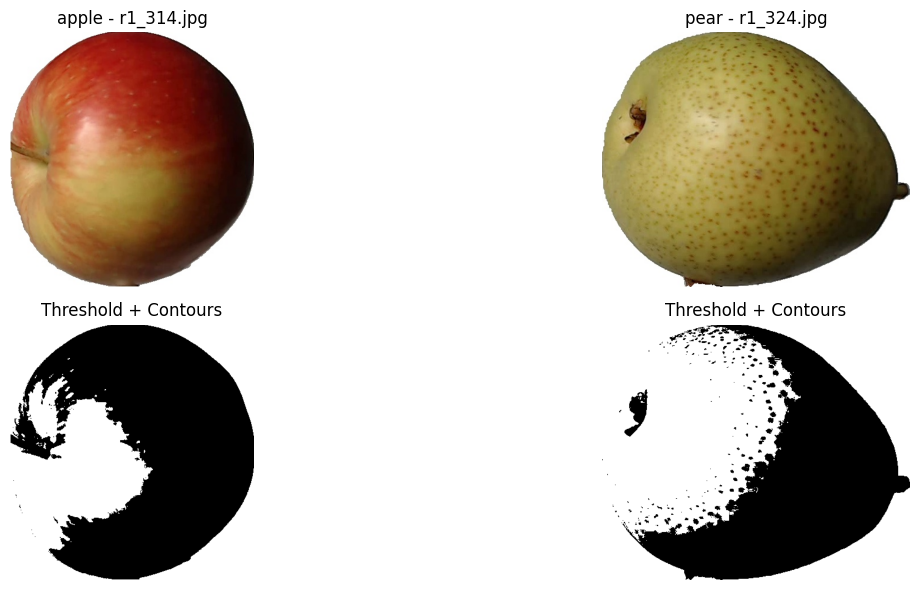

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

folders = ["apple", "pear"]
valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.tiff')

# Periksa folder
for folder in folders:
    if not os.path.exists(folder):
        print(f"Warning: Folder '{folder}' tidak ditemukan!")
        
features = {folder: [] for folder in folders}

# Proses setiap folder
for folder in folders:
    if not os.path.exists(folder):
        continue
    for filename in os.listdir(folder):
        if filename.lower().endswith(valid_extensions):
            image_path = os.path.join(folder, filename)
            image_color = cv2.imread(image_path)
            image_gray = cv2.imread(image_path, 0)
            if image_color is None or image_gray is None:
                print(f"Gagal membaca file {filename}, lewati.")
                continue

            # Threshold biner
            _, thresh = cv2.threshold(image_gray, 127, 255, cv2.THRESH_BINARY)

            # Deteksi kontur
            contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

            # Hitung ciri bentuk untuk tiap kontur
            shape_features = []
            for cnt in contours:
                area = cv2.contourArea(cnt)
                perimeter = cv2.arcLength(cnt, True)
                circularity = 4 * np.pi * (area / perimeter**2) if perimeter > 0 else 0
                shape_features.append({
                    "area": area,
                    "perimeter": perimeter,
                    "circularity": circularity
                })

            # Gambar kontur putih di threshold
            thresh_with_contours = thresh.copy()
            cv2.drawContours(thresh_with_contours, contours, -1, (255, 255, 255), 1)

            image_rgb = cv2.cvtColor(image_color, cv2.COLOR_BGR2RGB)

            # Simpan data
            features[folder].append({
                "filename": filename,
                "image_rgb": image_rgb,
                "thresh_contours": thresh_with_contours,
                "shape_features": shape_features
            })

# Visualisasi perbandingan
max_len = max(len(features[f]) for f in folders)

for i in range(max_len):
    plt.figure(figsize=(16, 6))
    
    for j, folder in enumerate(folders):
        if i < len(features[folder]):
            data = features[folder][i]
            
            # Gambar asli
            plt.subplot(2, len(folders), j+1)
            plt.imshow(data["image_rgb"])
            plt.title(f"{folder} - {data['filename']}")
            plt.axis('off')
            
            # Threshold + kontur
            plt.subplot(2, len(folders), j+1+len(folders))
            plt.imshow(data["thresh_contours"], cmap='gray')
            plt.title("Threshold + Contours")
            plt.axis('off')
            
            # Tampilkan info ciri bentuk di console
            print(f"\nFolder: {folder}, File: {data['filename']}")
            for k, ftr in enumerate(data["shape_features"]):
                print(f" Kontur {k+1}: Area={ftr['area']:.2f}, Perimeter={ftr['perimeter']:.2f}, Circularity={ftr['circularity']:.4f}")
    
    plt.tight_layout()
    plt.show()